## Analysis of the most frequently used words

The purpose of the following analysis is to find the most commonly used words in negative and positive sentiment comments. I will use the data taken by Apache Nifi and loaded into S3.
First, I will connect to S3 with Access Key and Secret Key to mount nifi-negative-bucket and nifi-positive-bucket data to DBFS.

Architecture' size too small for label
Architecture' size too small for label


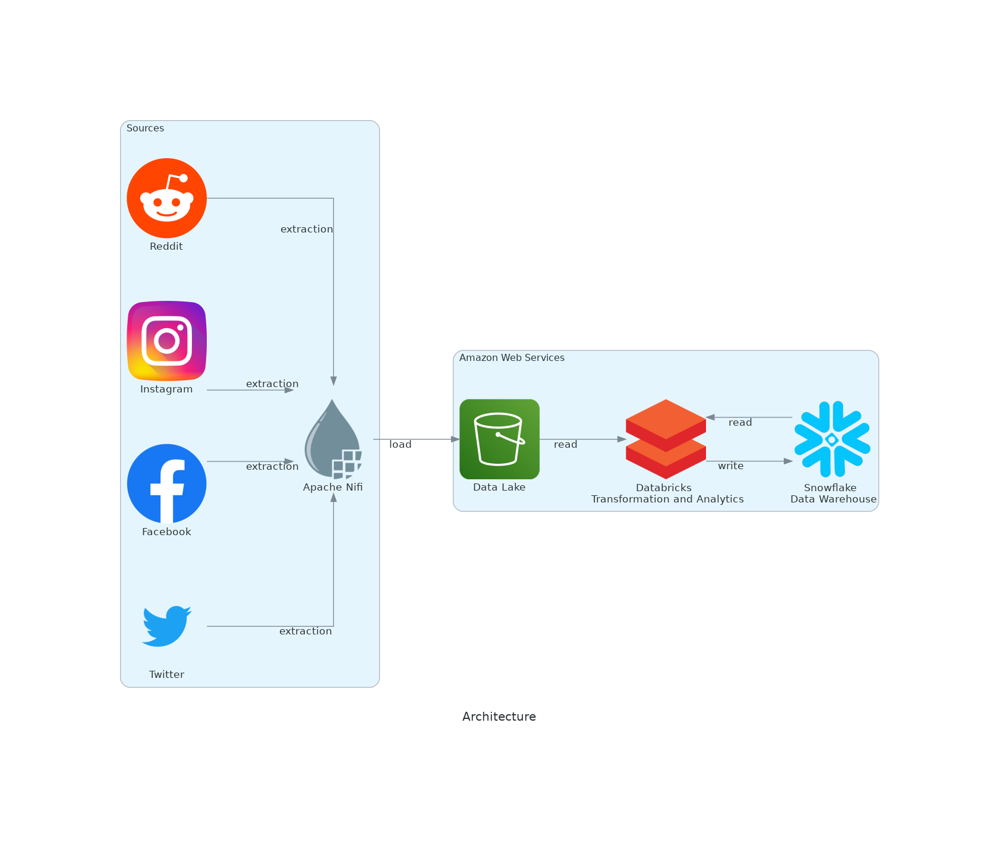

In [0]:
from urllib.request import urlretrieve
from diagrams import Cluster, Diagram, Edge
from diagrams.aws.storage import S3
from diagrams.onprem.analytics import Databricks
from diagrams.saas.analytics import Snowflake
from diagrams.onprem.workflow import Nifi
from diagrams.saas.social import Facebook
from diagrams.saas.social import Twitter
from diagrams.custom import Custom

edge_attr = {
    "minlen": "2.0"
}

with Diagram("\nArchitecture", filename="diagram", show=False, 
        edge_attr=edge_attr) as diag:
   
    with Cluster("Amazon Web Services"):
        s3 = S3("Data Lake")
        databricks = Databricks("Databricks \n Transformation and Analytics")
        snowflake = Snowflake("Snowflake \n Data Warehouse")            
        
    with Cluster("Sources"):
        reddit_url = "https://cdn-icons-png.flaticon.com/512/5968/5968908.png"
        reddit_icon = "5968908.png"
        instagram_url = "https://cdn-icons-png.flaticon.com/512/1409/1409946.png"
        instagram_icon = "1409946.png"

        urlretrieve(reddit_url, reddit_icon)
        urlretrieve(instagram_url, instagram_icon)

        reddit = Custom("Reddit", reddit_icon )
        instagram = Custom("Instagram", instagram_icon )
        facebook = Facebook("Facebook")
        twitter = Twitter("Twitter")
    
        nifi = Nifi("Apache Nifi")
    
#     facebook >> Edge(label="ekstrakcja") >> nifi 
#     twitter >> Edge(label="ekstrakcja") >> nifi 
#     reddit >> Edge(label="ekstrakcja") >> nifi 
#     instagram >> Edge(label="ekstrakcja") >> nifi 
    
     
[facebook, twitter, reddit, instagram] >> Edge(xlabel="extraction") >> nifi >> Edge(xlabel="load") >> s3 >> Edge(xlabel="read") >> databricks  >> Edge(xlabel="write") >> snowflake >> Edge(xlabel="read") >>  databricks
diag

#### 1. Mounting the data from the buckets in S3

In [0]:
AccessKey = "<ACCESS KEY>"
SecretKey = "<SECRET KEY>"
EncodedSecretKey = SecretKey.replace("/","%2F")
AWSBucketName = "nifi-negative-bucket"
AWSBucketName2 = "nifi-positive-bucket"
MountName = "nifiS3negative"
MountName2 = "nifiS3positive"

In [0]:
dbutils.fs.mount("s3a://%s:%s@%s" % (AccessKey, EncodedSecretKey, AWSBucketName), "/mnt/%s" % MountName)
dbutils.fs.mount("s3a://%s:%s@%s" % (AccessKey, EncodedSecretKey, AWSBucketName2), "/mnt/%s" % MountName2)

display(dbutils.fs.ls("/mnt/%s" % MountName))

#### 2. Reading data from S3

On the cluster, via the Maven repository, I install the com.johnsnowlabs.nlp library: spark-nlp_2.12:3.4.0, and then via PyPi I install the spark-nlp packages provided by John Snow Labs, nltk and wordcloud.

In [0]:
import sparknlp
sparknlp.start()

from sparknlp.pretrained import PretrainedPipeline
from pyspark.ml import Pipeline
from sparknlp.base import *
from sparknlp.annotator import *

import pyspark.sql.functions as f

import nltk
from nltk import FreqDist

from wordcloud import WordCloud

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
%matplotlib inline

In [0]:
df_neg = spark.read.json("/mnt/%s/" % MountName)
df_pos = spark.read.json("/mnt/%s/" % MountName2)

#### 3. Preparation of the Data Frame

In [0]:
display(df_neg.describe())

summary,creationtime,language,location,network,postid,sentiment,text,userid,username,uuid
count,580,580,287,580,580,580,580,580,579,580
mean,null,null,null,null,1.55637841541364762E18,null,null,9.6913374658007898E17,416.0,null
stddev,null,null,null,null,2.9376935578624512E17,null,null,5.4473538137206157E17,465.3443169668384,null
min,2022-01-06 13:41:48 +00000,de,,instagram,08NIOZCM6SQ,negative,Folgt deutscheminecraftfakten f r t glich coole Fakten rund um Minecraft Ihr habt coole Fakten und wollt erw hnt werden Dann lasst es mich per DM wissen Du suchst einen deutschsprachigen Discordserver rund um Minecraft Klick auf den Link,1026948326388912128,## cart || finals week,001b5a53-632c-44dc-8e65-64709319303d
max,2022-01-29 15:42:41 +00000,ru,🍞,youtube,zi8AAqUfgTE,negative,xk no ponen en minecraft un sistema pa invitar amigos esk estoy harta y kiero invitar a pablo a mi mundo no puede venir,time_is_n0w,📎 tristin/effy/icarus/nico ᓚᘏᗢ,fdea279f-c4ea-489e-96c1-ec38f61e40fb


In [0]:
display(df_pos.describe())

summary,creationtime,language,location,network,postid,sentiment,text,userid,username,uuid
count,711,711,309,711,711,711,711,641,706,711
mean,null,null,null,null,1.62783391319850266E18,null,30.0,8.2283498564794317E17,null,null
stddev,null,null,null,null,4.009384439132455E17,null,null,6.201856927562048E17,null,null
min,2021-09-27 00:52:26 +00000,de,,facebook,1479086555100811269,positive,2 5,1004348449934852096,-ˏˋ⋆ ̥ ᴘɪʀɪ⁷ 🍯,00192d36-0b7a-46af-a3ba-3e7277337907
max,2022-01-29 15:42:33 +00000,ru,𝘢𝘯𝘺 𝘱𝘳𝘰𝘯𝘰𝘶𝘯,youtube,zZipVuTlKgA,positive,woah just like minecraft https t co ToWJYqUGPW,xxShadowRingxx,🧠,ffda63ce-3eef-44af-b90d-68b3f034a9c7


In [0]:
display(df_neg.orderBy(f.col("creationtime"), ascending = False))

creationtime,language,location,network,postid,sentiment,text,userid,username,uuid
2022-01-29 15:42:41 +00000,en,your basement,twitter,1487451138102280201,negative,Heckthewakeful ms peaceweaver It s this incredibly weird reality is a Minecraft game where everyone can exist independently from any sense of community thereby solving all of our problems sentiment,1279853087411363842,The Great Hippo,f932ef8b-e0ff-4b4f-9757-7dfe5f1d37b8
2022-01-29 15:40:29 +00000,en,blk she/her - kenia,twitter,1487450586299707395,negative,How is there an acc known for exposing shit that goes on in the Minecraft gets exposed for doing the same exact things they were calling out and for grooming minors,85408374,hot girl era aka single girl era,0d3ff1ca-af4b-4b2b-b7bf-dd3f6c11391a
2022-01-29 15:40:10 +00000,en,forest biome,twitter,1487450506851401730,negative,why notch get fired from minecraft,858414292168826880,minecraftjac3,77f0a030-affe-410f-9957-5f3b585e48ee
2022-01-29 15:39:02 +00000,es,"Barcelona, España",twitter,1487450218459185152,negative,RT freeman35g TORNEO DE MINECRAFT 100 jugadores luchando a muerte por el incre ble bote de 10 cortesia de fvrnandiito s ganle obligado La actividad ser sorpresa hasta el momento de empezar Comentad los que quer is participar RT fav comenten https t co UlRDt86u27 https t co 14DZCJ2qbY,1402812260154761218,Tyder,19fd60e2-32b1-4542-9dee-4b486e953083
2022-01-29 15:38:42 +00000,pt,,twitter,1487450133814034435,negative,que dor de cabe a pra baixar um minecraft que n o bug na hora de criar uma sala,1380144386315538433,LOS artur 🧙🏻,9852d0df-d4db-4f1d-91e8-505aefa07050
2022-01-29 15:38:33 +00000,en,,twitter,1487450099374768129,negative,do you guys play Clash of Clans Minecraft Michael5SOS,750490548801122304,🌴,a791791f-eee8-493e-8a85-2bb6cded0d8b
2022-01-29 15:37:45 +00000,en,not there anymore,twitter,1487449896605077511,negative,catsranboo Hay day angry birds especially the star wars ones minecraft toca boca,1427593040047247361,Mori | he/they | bootwt sd 📌,2c8db000-3625-4200-afb9-dc7dc0974d99
2022-01-29 15:37:23 +00000,en,"Pittsburgh, PA",twitter,1487449803218993157,negative,VastGG It was for Minecraft TheGavMaster1 I disliked it immediately and when I found out how to change it a few months later it became Gav Attack,1218335879506399232,GavAttackO,d60316f2-25d8-4210-bd9d-09127db81251
2022-01-29 15:35:28 +00000,en,"Eure-et-Loir, Centre",twitter,1487449320773279744,negative,Minecraft uhc mumble attack on titan aot on fuck le monde https t co v7ATzDD8jd,3317089096,iBl3u,371bd78d-25a1-4471-8818-314cf8c3f144
2022-01-29 15:35:02 +00000,en,The Closet,twitter,1487449211298004994,negative,RT Amizziko harassment on the mc server jschlatt schlatt jschlattfanart epicsmp mcytfanart minecraft https t co DU9NL9xXWg,1278951787450347521,Mr Electric,87ab93a3-0307-4595-abf8-e0ad0498e998


In [0]:
df_neg = df_neg.dropDuplicates(["text"])
df_pos = df_pos.dropDuplicates(["text"])
display(df_neg)

creationtime,language,location,network,postid,sentiment,text,userid,username,uuid
2022-01-29 15:30:08 +00000,de,null,instagram,2761950753856494270,negative,Folgt deutscheminecraftfakten f r t glich coole Fakten rund um Minecraft Ihr habt coole Fakten und wollt erw hnt werden Dann lasst es mich per DM wissen Du suchst einen deutschsprachigen Discordserver rund um Minecraft Klick auf den Link,32921723396,Deutsche Minecraft Fakten,54c98633-036e-4424-ad21-6c429281cd5c
2022-01-26 11:00:05 +00000,pt,null,youtube,7CAX3wKFp80,negative,IMPOSS VEL ACERTAR ESSA FLECHA DA TORRE 28 Creative Squad II DESAFIO DE ARQUEIRO NO AR E NA TERRA PRA DESCOBRIR QUANTOS BLOCOS DE DIST NCIA POSSIVEL ACERTAR,UCukwGwBD-pAbGzoJo6ZXPtQ,Tonigon,e766f1b0-4535-429c-a790-22476f97a865
2022-01-29 15:31:37 +00000,en,🍞,twitter,1487448355122733056,negative,it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk,1460968231699501062,𝐆𝐑𝐈𝐀𝐍 🍞,db862194-e8d0-46a2-8f00-66897af31e06
2022-01-20 12:37:13 +00000,en,,twitter,1484142974258880512,negative,2Tangled2Tom mask bastard I they can combine their power to make Star Wars Minecraft and Disney can t hardly do nothing about it,1249496954268082177,NickJam,937d852c-62c0-4cfa-a218-2515b9748cf8
2022-01-26 14:55:46 +00000,en,,twitter,1486352167233630227,negative,69taneli69 Sky does Minecraft is the most recent that got into some shit Some really serious and awful shit,957192941822496768,ً,be1d7978-ffc1-4aa9-8e12-a0e34195448f
2022-01-20 12:35:27 +00000,es,Santo Domingo,twitter,1484142529465524224,negative,BarsinsorielxD ZoupZeebaz Creeper y Zombie a l nea de fuego donde sangre derramo Eh eh m rame de frente No me escondo te deparar la muerte We eh dentro del mundo de Minecraft si que puedo valerme,1400967800563417088,ඞSprite-Man ඞ@hotmail.com,a0e438f1-f78a-48a8-9138-fe298195a903
2022-01-10 08:23:33 +00000,en,,twitter,1480455259147276288,negative,DMeme37 Ok relax u fucking play Minecraft u nerd lmao https t co mFWObrMqeM,1371862227322503170,SSJ4 CockGeta,e1bb3eed-0428-47c6-a9eb-2cda7753a215
2022-01-27 13:55:02 +00000,en,,twitter,1486699270686318596,negative,Derpled Minecraft bedwars proximity chat I miss these types of videos from you tubers ngl,1476818719473033225,vBienas,6ac3e433-cc6b-432f-a340-ee62d9854825
2022-01-21 11:38:44 +00000,fr,,twitter,1484490641870569473,negative,Dinaz Zz Blue88Force ZeratoR Eterr Ils ont minecraft c est suffisant pour ne pas tre perte,893976895284551681,Jb perreti,1ebb63f4-17f5-4af3-b89b-5617d6ef4c77
2022-01-21 11:56:42 +00000,fr,,twitter,1484495165964406784,negative,FarouqBelasri minecraft fra On parle bien autant de plein d autres personnes On parle de fanta si on a envie de parler de lui Je ne vois pas le crime de parler de lui,1477964339768344577,Dr. Gaster,8052b692-9b47-434e-9d9f-7fb0fc270772


In [0]:
df_neg_en = df_neg.filter(f.col("language") == "en").select("text")
df_pos_en = df_pos.filter(f.col("language") == "en").select("text")

In [0]:
print('df_neg_en size', df_neg_en.count())
print('df_pos_en size', df_pos_en.count())

df_neg_en size 221
df_pos_en size 305


In [0]:
df_pos_en.selectExpr('length(text) AS text_len')\
    .toPandas().describe()

,text_len
count,305.000000
mean,183.426230
std,91.015408
min,16.000000
25%,105.000000
50%,179.000000
75%,284.000000
max,337.000000


In [0]:
df_neg_en.selectExpr('length(text) AS text_len')\
    .toPandas().describe()

,text_len
count,221.000000
mean,155.303167
std,87.540035
min,15.000000
25%,81.000000
50%,145.000000
75%,215.000000
max,315.000000


A DataFrame with positive posts has 305 rows, while a DataFrame with negative posts has 221 rows. The collection includes posts from social media, hence the text is usually short. The shortest post is only 15 characters long.

#### 4.  Spark NLP

The dataset is very small, so the most common words could also be computed using one of the Python libraries, for example NLTK.
Nevertheless, I wanted to introduce Databricks to machine learning. For this purpose, I used the Spark NLP library. Using Spark NLP, I created a simple pipeline to process the text of the posts. In Spark NLP you can use ready-made models, for example: "explain_document_ml"

In [0]:
pipeline = PretrainedPipeline("explain_document_ml", lang="en")
annotation = pipeline.transform(df_neg_en)

display(annotation)

explain_document_ml download started this may take some time.
Approx size to download 9.1 MB
[OK!]


text,document,sentence,token,spell,lemmas,stems,pos
it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk,"List(List(document, 0, 111, it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk , Map(sentence -> 0), List()))","List(List(document, 2, 109, it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk, Map(sentence -> 0), List()))","List(List(token, 2, 3, it, Map(sentence -> 0), List()), List(token, 5, 9, yelps, Map(sentence -> 0), List()), List(token, 11, 13, and, Map(sentence -> 0), List()), List(token, 15, 19, pulls, Map(sentence -> 0), List()), List(token, 21, 23, the, Map(sentence -> 0), List()), List(token, 25, 30, bitten, Map(sentence -> 0), List()), List(token, 32, 35, hand, Map(sentence -> 0), List()), List(token, 37, 38, to, Map(sentence -> 0), List()), List(token, 40, 41, it, Map(sentence -> 0), List()), List(token, 43, 43, s, Map(sentence -> 0), List()), List(token, 45, 49, chest, Map(sentence -> 0), List()), List(token, 51, 54, with, Map(sentence -> 0), List()), List(token, 56, 56, a, Map(sentence -> 0), List()), List(token, 58, 64, shocked, Map(sentence -> 0), List()), List(token, 66, 69, look, Map(sentence -> 0), List()), List(token, 74, 79, wilbur, Map(sentence -> 0), List()), List(token, 81, 89, minecraft, Map(sentence -> 0), List()), List(token, 98, 102, angry, Map(sentence -> 0), List()), List(token, 104, 109, squawk, Map(sentence -> 0), List()))","List(List(token, 2, 3, it, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 5, 9, yelps, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 11, 13, and, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 15, 19, pulls, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 21, 23, the, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 25, 30, bitten, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 32, 35, hand, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 37, 38, to, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 40, 41, it, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 43, 43, s, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 45, 49, chest, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 51, 54, with, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 56, 56, a, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 58, 64, shocked, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 66, 69, look, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 74, 79, wilbur, Map(confidence -> 0.0, sentence -> 0), List()), List(token, 81, 89, minecraft, Map(confidence -> 0.0, sentence -> 0), List()), List(token, 98, 102, angry, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 104, 109, squawk, Map(confidence -> 1.0, sentence -> 0), List()))","List(List(token, 2, 3, it, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 5, 9, yelp, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 11, 13, and, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 15, 19, pull, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 21, 23, the, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 25, 30, bitten, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 32, 35, hand, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 37, 38, to, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 40, 41, it, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 43, 43, s, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 45, 49, chest, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 51, 54, with, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 56, 56, a, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 58, 64, shock, Map(confidence -> 1.0, sentence -> 0), List()), List(token, 66, 69, look, Map(c

However, for the calculation of the most frequently used words, I will create my own pipeline, to which, in addition to the ones used in the model: Document Assembler, Tokenizer and Lemmatizer, I will add stages: Normalizer, Stop Words Cleaner and Finisher.

###### 3.1.1 Document Assembler and Tokenizer

In [0]:
# Document Assembler
assembler = DocumentAssembler()\
      .setInputCol("text")\
      .setOutputCol("document")\
      .setCleanupMode("shrink")
doc_df_neg = assembler.transform(df_neg_en)
doc_df_pos = assembler.transform(df_pos_en)

# Tokenizer
tokenizer = Tokenizer() \
    .setInputCols(["document"]) \
    .setOutputCol("tokens")

token_df_neg = tokenizer.fit(doc_df_neg).transform(doc_df_neg)

display(token_df_neg)

text,document,tokens
it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk,"List(List(document, 0, 97, it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 7, yelps, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 17, pulls, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 62, shocked, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))"
2Tangled2Tom mask bastard I they can combine their power to make Star Wars Minecraft and Disney can t hardly do nothing about it,"List(List(document, 0, 127, 2Tangled2Tom mask bastard I they can combine their power to make Star Wars Minecraft and Disney can t hardly do nothing about it, Map(sentence -> 0), List()))","List(List(token, 0, 11, 2Tangled2Tom, Map(sentence -> 0), List()), List(token, 13, 16, mask, Map(sentence -> 0), List()), List(token, 18, 24, bastard, Map(sentence -> 0), List()), List(token, 26, 26, I, Map(sentence -> 0), List()), List(token, 28, 31, they, Map(sentence -> 0), List()), List(token, 33, 35, can, Map(sentence -> 0), List()), List(token, 37, 43, combine, Map(sentence -> 0), List()), List(token, 45, 49, their, Map(sentence -> 0), List()), List(token, 51, 55, power, Map(sentence -> 0), List()), List(token, 57, 58, to, Map(sentence -> 0), List()), List(token, 60, 63, make, Map(sentence -> 0), List()), List(token, 65, 68, Star, Map(sentence -> 0), List()), List(token, 70, 73, Wars, Map(sentence -> 0), List()), List(token, 75, 83, Minecraft, Map(sentence -> 0), List()), List(token, 85, 87, and, Map(sentence -> 0), List()), List(token, 89, 94, Disney, Map(sentence -> 0), List()), List(token, 96, 98, can, Map(sentence -> 0), List()), List(token, 100, 100, t, Map(sentence -> 0), List()), List(token, 102, 107, hardly, Map(sentence -> 0), List()), List(token, 109, 110, do, Map(sentence -> 0), List()), List(token, 112, 118, nothing, Map(sentence -> 0), List()), List(token, 120, 124, about, Map(sentence -> 0), List()), List(token, 126, 127, it, Map(sentence -> 0), List()))"
69taneli69 Sky does Minecraft is the most recent that got into some shit Some really serious and awful shit,"List(List(document, 0, 106, 69taneli69 Sky does Minecraft is the most recent that got into some shit Some really serious and awful shit, Map(sentence -> 0), List()))","List(List(token, 0, 9, 69taneli69, Map(sentence -> 0), List()), List(token, 11, 13, Sky, Map(sentence -> 0), List()), List(token, 15, 18, does, Map(sentence -> 0), List()), List(token, 20, 28, Minecraft, Map(sentence -> 0), List()), List(token, 30, 31, is, Map(sentence -> 0), List()), List(token, 33, 35, the, Map(sentence -> 0), List()), List(token, 37, 40, most, Map(sentence -> 0), List()), List(token, 42, 47, recent, Map(sentence -> 0), List()), List(token, 49, 52, that, Map(sentence -> 0), List()), List(token, 54, 56, got, Map(sentence -> 0), List()), List(token, 58, 61, into, Map(sentence -> 0), List()), List(token, 63, 66, some, Map(sentence -> 0), List()), List(token, 68, 71, shit, Map(sentence -> 0), List()), List(token, 73, 76, Some, Map(sentence -> 0), List())

###### 3.1.2 Lematizer

In [0]:
lemmatizer = LemmatizerModel.pretrained() \
    .setInputCols(["tokens"]) \
    .setOutputCol("lemmas")

nlpPipeline = Pipeline(stages=[
    assembler, 
    tokenizer,
    lemmatizer
 ])

result_neg = nlpPipeline.fit(df_neg_en).transform(df_neg_en)

display(result_neg)

lemma_antbnc download started this may take some time.
Approximate size to download 907.6 KB
[OK!]


text,document,tokens,lemmas
it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk,"List(List(document, 0, 97, it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 7, yelps, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 17, pulls, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 62, shocked, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 7, yelp, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 17, pull, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 62, shock, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))"
2Tangled2Tom mask bastard I they can combine their power to make Star Wars Minecraft and Disney can t hardly do nothing about it,"List(List(document, 0, 127, 2Tangled2Tom mask bastard I they can combine their power to make Star Wars Minecraft and Disney can t hardly do nothing about it, Map(sentence -> 0), List()))","List(List(token, 0, 11, 2Tangled2Tom, Map(sentence -> 0), List()), List(token, 13, 16, mask, Map(sentence -> 0), List()), List(token, 18, 24, bastard, Map(sentence -> 0), List()), List(token, 26, 26, I, Map(sentence -> 0), List()), List(token, 28, 31, they, Map(sentence -> 0), List()), List(token, 33, 35, can, Map(sentence -> 0), List()), List(token, 37, 43, combine, Map(sentence -> 0), List()), List(token, 45, 49, their, Map(sentence -> 0), List()), List(token, 51, 55, power, Map(sentence -> 0), List()), List(token, 57, 58, to, Map(sentence -> 0), List()), List(token, 60, 63, make, Map(sentence -> 0), List()), List(token, 65, 68, Star, Map(sentence -> 0), List()), List(token, 70, 73, Wars, Map(sentence -> 0), List()), List(token, 75, 83, Minecraft, Map(sentence -> 0), List()), List(token, 85, 87, and, Map(sentence -> 0), List()), List(token, 89, 94, Disney, Map(sentence -> 0), List()), List(token, 96, 98, can, Map(sentence -> 0), List()), List(token, 100, 100, t, Map(sentence -> 0), List()), List(token, 102, 107, hardly, Map(sentence -> 0), List()), List(token, 109, 110, do, Map(sentence -> 0), List()), List(token, 112, 118, nothing, Map(sentence -> 0), List()), List(token, 120, 124, about, Map(sentence -> 0), List()), List(token, 126, 127, it, Map(sentence -> 0), List()))","L

###### 3.1.3 Normalizer

In [0]:
normalizer = Normalizer() \
    .setInputCols(["lemmas"]) \
    .setOutputCol("normalized")\
    .setLowercase(True)

result_norm_neg = normalizer.fit(result_neg).transform(result_neg)

display(result_norm_neg)

text,document,tokens,lemmas,normalized
it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk,"List(List(document, 0, 97, it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 7, yelps, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 17, pulls, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 62, shocked, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 7, yelp, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 17, pull, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 62, shock, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 6, yelp, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 16, pull, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 60, shock, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))"
2Tangled2Tom mask bastard I they can combine their power to make Star Wars Minecraft and Disney can t hardly do nothing about it,"List(List(document, 0, 127, 2Tangled2Tom mask bastard I they can combine their power to make Star Wars Minecraft and Disney can t hardly do nothing about it, Map(sentence -> 0), List()))","List(List(token, 0, 11, 2Tangled2Tom, Map(sentence -> 0), List()), List(token, 13, 16, mask, Map(sentence -> 0), List()), List(token, 18, 24, bastard, Map(sentence -> 0), List()), List(token, 26, 26, I, Map(sentence -> 0), List()), List(tok

###### 3.1.4 Stop Words Cleaner

In [0]:
stopwords_cleaner = StopWordsCleaner.pretrained("stopwords_en", "en") \
        .setInputCols(["normalized"]) \
        .setOutputCol("cleanTokens")

nlpPipeline = Pipeline(stages=[
    assembler, 
    tokenizer,
    lemmatizer,
    normalizer,
    stopwords_cleaner
 ])

result = nlpPipeline.fit(df_neg_en).transform(df_neg_en)

display(result)

stopwords_en download started this may take some time.
Approximate size to download 2.9 KB
[OK!]


text,document,tokens,lemmas,normalized,cleanTokens
it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk,"List(List(document, 0, 97, it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 7, yelps, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 17, pulls, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 62, shocked, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 7, yelp, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 17, pull, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 62, shock, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))","List(List(token, 0, 1, it, Map(sentence -> 0), List()), List(token, 3, 6, yelp, Map(sentence -> 0), List()), List(token, 9, 11, and, Map(sentence -> 0), List()), List(token, 13, 16, pull, Map(sentence -> 0), List()), List(token, 19, 21, the, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 35, 36, to, Map(sentence -> 0), List()), List(token, 38, 39, it, Map(sentence -> 0), List()), List(token, 41, 41, s, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 49, 52, with, Map(sentence -> 0), List()), List(token, 54, 54, a, Map(sentence -> 0), List()), List(token, 56, 60, shock, Map(sentence -> 0), List()), List(token, 64, 67, look, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sentence -> 0), List()))","List(List(token, 3, 6, yelp, Map(sentence -> 0), List()), List(token, 13, 16, pull, Map(sentence -> 0), List()), List(token, 23, 28, bitten, Map(sentence -> 0), List()), List(token, 30, 33, hand, Map(sentence -> 0), List()), List(token, 43, 47, chest, Map(sentence -> 0), List()), List(token, 56, 60, shock, Map(sentence -> 0), List()), List(token, 69, 74, wilbur, Map(sentence -> 0), List()), List(token, 76, 84, minecraft, Map(sentence -> 0), List()), List(token, 86, 90, angry, Map(sentence -> 0), List()), List(token, 92, 97, squawk, Map(sent

###### 3.1.5 Finisher

In [0]:
finisher = Finisher().setInputCols(["cleanTokens"])

###### 3.1.6 Pipeline

In [0]:
nlpPipeline = Pipeline(stages=[
    assembler, 
    tokenizer,
    lemmatizer,
    normalizer,
    stopwords_cleaner,
    finisher
 ])

result_neg = nlpPipeline.fit(df_neg_en).transform(df_neg_en)
result_pos = nlpPipeline.fit(df_pos_en).transform(df_pos_en)

display(result_neg)

text,finished_cleanTokens
it yelps and pulls the bitten hand to it s chest with a shocked look wilbur minecraft angry squawk,"List(yelp, pull, bitten, hand, chest, shock, wilbur, minecraft, angry, squawk)"
2Tangled2Tom mask bastard I they can combine their power to make Star Wars Minecraft and Disney can t hardly do nothing about it,"List(tangledtom, mask, bastard, combine, power, make, star, wars, minecraft, disney)"
69taneli69 Sky does Minecraft is the most recent that got into some shit Some really serious and awful shit,"List(taneli, sky, minecraft, recent, shit, awful, shit)"
DMeme37 Ok relax u fucking play Minecraft u nerd lmao https t co mFWObrMqeM,"List(dmeme, relax, fucking, play, minecraft, nerd, lmao, https, mfwobrmqem)"
Derpled Minecraft bedwars proximity chat I miss these types of videos from you tubers ngl,"List(derpled, minecraft, bedwars, proximity, chat, miss, type, video, tuber, ngl)"
FavScrub Bro this ll literally just make it worse install minecraft or something man c mon let s talk this through,"List(favscrub, bro, ll, literally, make, bad, install, minecraft, man, mon, talk)"
Gl acial Minecraft You wanna die buddy,"List(gl, acial, minecraft, wanna, die, buddy)"
HawerMine Get the same thing about fake news of Minecraft,"List(hawermine, thing, fake, news, minecraft)"
Heckthewakeful ms peaceweaver It s this incredibly weird reality is a Minecraft game where everyone can exist independently from any sense of community thereby solving all of our problems sentiment,"List(heckthewakeful, ms, peaceweaver, incredibly, weird, reality, minecraft, game, exist, independently, sense, community, solve, problem, sentiment)"
I m literally wearing minecraft YouTuber merch right now This is exactly why I hate gay people,"List(literally, wear, minecraft, youtuber, merch, hate, gay, people)"


In [0]:
result_df_neg = result_neg.select(f.explode("finished_cleanTokens").alias("all_words"))
display(result_df_neg)

all_words
yelp
pull
bitten
hand
chest
shock
wilbur
minecraft
angry
squawk


In [0]:
result_df_pos = result_pos.select(f.explode("finished_cleanTokens").alias("all_words"))
display(result_df_pos)

all_words
shadow
craft
shadow
craft
server
hang
friend
make
friend
survive


#### 4. The most frequently used words

I check the most used words with the NLTK library:

In [0]:
result_pd_neg = result_df_neg.toPandas()
result_pd_pos = result_df_pos.toPandas()

In [0]:
freqdist_neg = nltk.FreqDist(result_pd_neg["all_words"])
freqdist_pos = nltk.FreqDist(result_pd_pos["all_words"])

freqdist_neg.most_common(10)

Out[40]: [('minecraft', 216),
 ('https', 59),
 ('play', 36),
 ('game', 28),
 ('school', 27),
 ('rt', 27),
 ('make', 26),
 ('server', 22),
 ('monster', 22),
 ('people', 19)]

In [0]:
display(df_pos_en.filter(f.col("text").contains("https")))

text
We re hiring Help bring amazing features to Essential as a Full Time Minecraft Mod Developer APPLY https t co 7a6BI5qKyl https t co ssreuQXju3
I m starting LIVE on Minecraft https t co OjnRWHzns9 wizebot twitch
GTWScar made an AMAZING end portal designed to look like a slice out of a geode last week and I was inspired to make one inspired by it but more like a whole geode with part taken out Might curl more rock around to create a sort of shelter but I m not sure yet Minecraft https t co bKsvUHbS64
ItsNeilisHere Hello I m Xylo We re a system streamer They it pronouns we want to make sure everyone s comfortable in our environment We play Minecraft mainly but also other games We do lore on smp s along with chaotic bedwars streams It would be awesome if someone could stop by https t co MfnyF6UtHb
Minecraft Juno Catfish Nice thing is I didn t have to make any new textures everything is reused from my skin https t co rt3F6M5MPp
SPONSORED Read on to learn Minecraft s initiatives which have had an innovative unprecedented global impact on learning https t co RXg3Wgp34o
cwsupermanlois supermanloiscw BitsieTulloch tylerhoechlin Hey guys I wanted to share this project I finished last night I built this in a game called Minecraft It took 31 862 blocks to construct This was a really fun project to build So I hope you guys like it https t co D5xtqBNR1b
10 BEST Texture Packs For Minecraft 1 18 RANKED https t co CWBKUi7sS1
10 Best Minecraft 1 18 Village Seeds for Bedrock Edition beebomco https t co 9NBQNva3aN
Best way to play Minecraft Minecraft XboxShare xbox https t co XXlxqRxaRb


In [0]:
# I remove words minecraft and https
result_pd_neg = result_pd_neg.query("all_words not in ('minecraft','https')")
result_pd_pos = result_pd_pos.query("all_words not in ('minecraft','https')")

In [0]:
freqdist_neg = nltk.FreqDist(result_pd_neg["all_words"])
freqdist_pos = nltk.FreqDist(result_pd_pos["all_words"])

freqdist_pos.most_common(10)

Out[43]: [('rt', 75),
 ('game', 53),
 ('make', 48),
 ('server', 44),
 ('good', 40),
 ('play', 39),
 ('build', 38),
 ('friend', 32),
 ('love', 29),
 ('video', 25)]

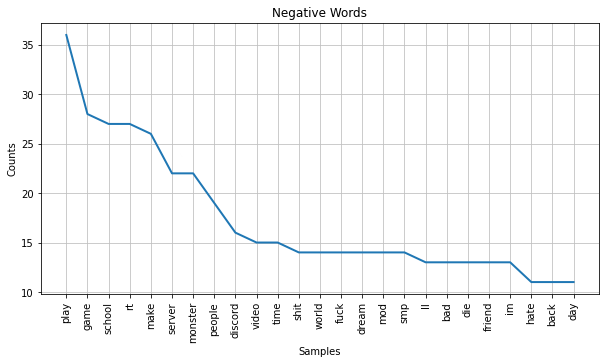

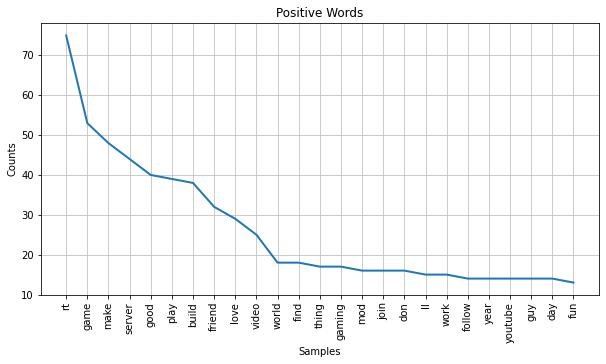

Out[44]: <AxesSubplot:title={'center':'Positive Words'}, xlabel='Samples', ylabel='Counts'>

In [0]:
figure(figsize=(10,5))
plt.title('Negative Words')
freqdist_neg.plot(25)

figure(figsize=(10,5))
plt.title('Positive Words')
freqdist_pos.plot(25)

I can also calculate the most frequently used words with pyspark:

In [0]:
count_df_neg = result_df_neg.groupBy("all_words")\
.agg(f.count(f.col("all_words")).alias("count")).orderBy(f.desc(f.col("count")))

display(count_df_neg)

all_words,count
minecraft,216
https,59
play,36
game,28
rt,27
school,27
make,26
server,22
monster,22
people,19


In [0]:
count_df_pos = result_df_pos.groupBy("all_words").agg(f.count(f.col("all_words")).alias("count")).orderBy(f.desc(f.col("count")))

display(count_df_pos)

all_words,count
minecraft,287
https,115
rt,75
game,53
make,48
server,44
good,40
play,39
build,38
friend,32


In [0]:
# remove words minecraft and https
count_df_pos = count_df_pos.filter((f.col("all_words") != "minecraft") & (f.col("all_words") != "https") )
count_df_neg = count_df_neg.filter((f.col("all_words") != "minecraft") & (f.col("all_words") != "https") )

In [0]:
count_pd_neg = count_df_neg.toPandas()
count_pd_pos = count_df_pos.toPandas()

In [0]:
display(count_pd_pos.head(25))

all_words,count
rt,75
game,53
make,48
server,44
good,40
play,39
build,38
friend,32
love,29
video,25


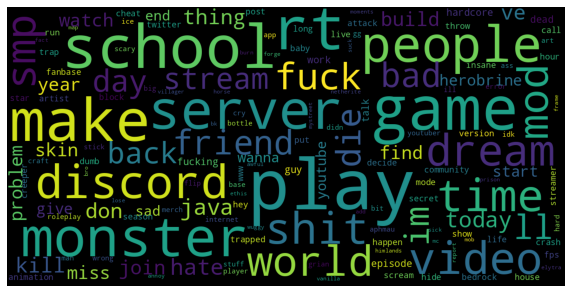

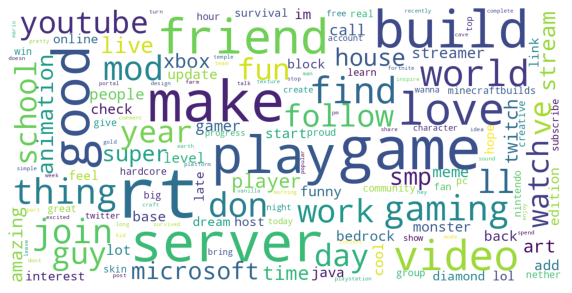

In [0]:
cloud_pos = count_pd_pos.set_index("all_words").to_dict()['count']
cloud_neg = count_pd_neg.set_index("all_words").to_dict()['count']

cloud1 = WordCloud(
  background_color="black",
  max_words=150,
  max_font_size=50, 
  scale=3
).generate_from_frequencies(cloud_neg)

cloud2 = WordCloud(
  background_color="white",
  max_words=150,
  max_font_size=50, 
  scale=3
).generate_from_frequencies(cloud_pos)


plt.figure(1, figsize=(10, 10))
plt.imshow(cloud1)
plt.axis("off")
plt.show()

plt.figure(1, figsize=(10, 10))
plt.imshow(cloud2)
plt.axis("off")
plt.show()

An interesting conslusion is that  the minecraft java edition appears more frequently in negative posts than minecraft bedrock edition. This may be the subject of further analysis.

#### 5. Writing dataframe to data warehouse and unmounting S3 buckets

In [0]:
# Create a connection to Snowflake and save both tables
options = dict(sfUrl="https://<ADDRESS>.aws.snowflakecomputing.com",
               sfUser="<USER>",
               sfPassword="<PASSWORD>",
               sfDatabase="ProjektDB",
               sfSchema="myschema",
               sfWarehouse="SMALL")

In [0]:
df_neg.write.format("snowflake") \
        .options(**options) \
        .option("dbtable", "NegativeTable") \
        .save()

df_pos.write.format("snowflake") \
        .options(**options) \
        .option("dbtable", "PositiveTable") \
        .save()

In [0]:
%fs mounts

mountPoint,source,encryptionType
/databricks-datasets,databricks-datasets,sse-s3
/databricks/mlflow-tracking,databricks/mlflow-tracking,sse-s3
/databricks-results,databricks-results,sse-s3
/databricks/mlflow-registry,databricks/mlflow-registry,sse-s3
/mnt/nifiS3positive,s3a://nifi-positive-bucket,
/mnt/nifiS3negative,s3a://nifi-negative-bucket,
/,DatabricksRoot,sse-s3


In [0]:
dbutils.fs.unmount("/mnt/nifiS3posts")